In [4]:
import os

import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
from torch import nn
from torch.utils.data import DataLoader
from pathlib import Path
from tempfile import gettempdir

from l5kit.data import LocalDataManager, ChunkedDataset
from l5kit.dataset import AgentDataset, EgoDataset
from l5kit.rasterization import build_rasterizer
from l5kit.evaluation import write_pred_csv, compute_metrics_csv, read_gt_csv, create_chopped_dataset
from l5kit.evaluation.chop_dataset import MIN_FUTURE_STEPS
from l5kit.visualization import PREDICTED_POINTS_COLOR, TARGET_POINTS_COLOR, draw_trajectory
from l5kit.geometry import transform_points
from l5kit.evaluation.metrics import neg_multi_log_likelihood, time_displace

from src.utils import load_config, get_model_class
# from src.dataset import load_datasets
from src.trainer import Trainer

C:\Users\bosch\Desktop\Lilach_Project\LyftTrajectoryPrediction\l5kit\l5kit\l5kit\dataset\select_agents.py:31: UserWarning: Windows detected. BLOSC_NOLOCK has not been set as it causes memory leaks on Windows.However, writing the mask with this config may be inconsistent.
  warnings.warn(


In [5]:
print(torch.cuda.is_available())

True


In [6]:
# Configurations
CONFIG_PATH = "models/configs/vit_b16_config.yaml"
MODEL_NAME = "ViTModel"  # name of model file in models/
EXP_NAME = "notebook_exp_vit"
CHECKPOINT_EPOCH = 2  # which epoch to load for evaluation/vis

# Load config
cfg = load_config(CONFIG_PATH)

In [7]:
# Paths
exp_dir = os.path.join("experiments", EXP_NAME)
os.makedirs(exp_dir, exist_ok=True)
ckpt_path = os.path.join(exp_dir, f"epoch_{CHECKPOINT_EPOCH}.pth")
pred_path = os.path.join(exp_dir, f"predictions_{CHECKPOINT_EPOCH}.csv")

In [ ]:
# Load Datasets
# train_loader, val_loader = load_datasets(cfg)
os.environ["L5KIT_DATA_FOLDER"] = "data/small_dataset"
# os.environ["L5KIT_DATA_FOLDER"] = "../data"
dm = LocalDataManager(None)
train_cfg = cfg["train_data_loader"]
rasterizer = build_rasterizer(cfg, dm)
train_zarr = ChunkedDataset(dm.require(train_cfg["key"])).open()
train_dataset = AgentDataset(cfg, train_zarr, rasterizer)
train_dataloader = DataLoader(train_dataset, shuffle=train_cfg["shuffle"], batch_size=train_cfg["batch_size"], 
                             num_workers=0) 
print(train_dataset)
print(len(train_dataset))

+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
| Num Scenes | Num Frames | Num Agents | Num TR lights | Total Time (hr) | Avg Frames per Scene | Avg Agents per Frame | Avg Scene Time (sec) | Avg Frame frequency |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
|    100     |   24838    |  1893736   |     316008    |       0.69      |        248.38        |        76.24         |        24.83         |        10.00        |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
111634


In [6]:
# Create Model
ModelClass = get_model_class(MODEL_NAME)
model = ModelClass(cfg)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda:0


In [7]:
print(model)
print(list(model.parameters()))
print(sum(p.numel() for p in model.parameters()))

ViTModel(
  (model): VisionTransformer(
    (conv_proj): Conv2d(25, 768, kernel_size=(16, 16), stride=(16, 16), bias=False)
    (encoder): Encoder(
      (dropout): Dropout(p=0.0, inplace=False)
      (layers): Sequential(
        (encoder_layer_0): EncoderBlock(
          (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (self_attention): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (dropout): Dropout(p=0.0, inplace=False)
          (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (mlp): MLPBlock(
            (0): Linear(in_features=768, out_features=3072, bias=True)
            (1): GELU(approximate='none')
            (2): Dropout(p=0.0, inplace=False)
            (3): Linear(in_features=3072, out_features=768, bias=True)
            (4): Dropout(p=0.0, inplace=False)
          )
        )
        (encoder_layer_1): EncoderBlock(
          (

In [8]:
# Train (only if checkpoint doesn't exist)
losses_train = []
if not os.path.exists(ckpt_path):
    print(f"Checkpoint not found at {ckpt_path}, training model...")
    trainer = Trainer(cfg, model, device, train_dataloader, exp_name=EXP_NAME)
    losses_train = trainer.train(CHECKPOINT_EPOCH)
else:
    print(f"Loading existing checkpoint: {ckpt_path}")
    model.load_state_dict(torch.load(ckpt_path))

Checkpoint not found at experiments\notebook_exp_vit\epoch_2.pth, training model...


loss: 47.03804016113281 loss(avg): 73.91789912223815: 100%|██████████| 500/500 [21:14<00:00,  2.55s/it] 


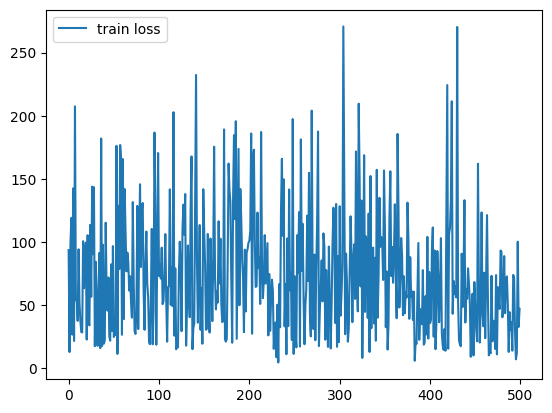

In [9]:
if losses_train:
    plt.plot(np.arange(len(losses_train)), losses_train, label="train loss")
    plt.legend()
    plt.show()

In [10]:
# ===== GENERATE AND LOAD CHOPPED DATASET
num_frames_to_chop = 100
eval_cfg = cfg["val_data_loader"]
eval_base_path = create_chopped_dataset(dm.require(eval_cfg["key"]), cfg["raster_params"]["filter_agents_threshold"], 
                              num_frames_to_chop, cfg["model_params"]["future_num_frames"], MIN_FUTURE_STEPS)

copying: 100%|██████████| 100/100 [00:10<00:00,  9.86it/s]
C:\Users\bosch\Desktop\Lilach_Project\LyftTrajectoryPrediction\l5kit\l5kit\l5kit\evaluation\extract_ground_truth.py:52: RuntimeWarning: you're running with a custom agents_mask
  dataset = AgentDataset(cfg=cfg, zarr_dataset=zarr_dataset, rasterizer=rasterizer, agents_mask=agents_mask)
extracting GT: 100%|██████████| 480/480 [00:04<00:00, 104.86it/s]


In [11]:
eval_zarr_path = str(Path(eval_base_path) / Path(dm.require(eval_cfg["key"])).name)
eval_mask_path = str(Path(eval_base_path) / "mask.npz")
eval_gt_path = str(Path(eval_base_path) / "gt.csv")

eval_zarr = ChunkedDataset(eval_zarr_path).open()
eval_mask = np.load(eval_mask_path)["arr_0"]
# ===== INIT DATASET AND LOAD MASK
eval_dataset = AgentDataset(cfg, eval_zarr, rasterizer, agents_mask=eval_mask)
eval_dataloader = DataLoader(eval_dataset, shuffle=eval_cfg["shuffle"], batch_size=eval_cfg["batch_size"], 
                             num_workers=0)
print(eval_dataset)

C:\Users\bosch\AppData\Local\Temp\ipykernel_14688\3364567597.py:8: RuntimeWarning: you're running with a custom agents_mask
  eval_dataset = AgentDataset(cfg, eval_zarr, rasterizer, agents_mask=eval_mask)


+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
| Num Scenes | Num Frames | Num Agents | Num TR lights | Total Time (hr) | Avg Frames per Scene | Avg Agents per Frame | Avg Scene Time (sec) | Avg Frame frequency |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
|    100     |   10000    |   751440   |     130740    |       0.28      |        100.00        |        75.14         |        10.00         |        10.00        |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+


In [12]:
# # Evaluation
# model.eval()
# criterion = torch.nn.MSELoss()
# total_loss, count = 0, 0

# with torch.no_grad():
#     for batch in val_loader:
#         preds = model(batch["image"])
#         loss = criterion(preds, batch["target_positions"])
#         total_loss += loss.item() * preds.size(0)
#         count += preds.size(0)

# print(f"Validation MSE: {total_loss / count:.4f}")

# ==== EVAL LOOP
def evaluate_model(model, eval_dataloader, device, pred_path):
    model.eval()
    criterion = nn.MSELoss(reduction="none")
    torch.set_grad_enabled(False)

    # store information for evaluation
    future_coords_offsets_pd = []
    timestamps = []
    agent_ids = []

    progress_bar = tqdm(eval_dataloader)
    for data in progress_bar:
        _, outputs = model.forward_pass(data, device, criterion)

        # convert agent coordinates into world offsets
        agents_coords = outputs.cpu().numpy()
        world_from_agents = data["world_from_agent"].numpy()
        centroids = data["centroid"].numpy()
        coords_offset = transform_points(agents_coords, world_from_agents) - centroids[:, None, :2]
        
        future_coords_offsets_pd.append(np.stack(coords_offset))
        timestamps.append(data["timestamp"].numpy().copy())
        agent_ids.append(data["track_id"].numpy().copy())
    
    write_pred_csv(pred_path,
               timestamps=np.concatenate(timestamps),
               track_ids=np.concatenate(agent_ids),
               coords=np.concatenate(future_coords_offsets_pd),
              )

In [13]:
# Evaluation (only if prediction doesn't exist)
if not os.path.exists(pred_path):
    print(f"Predictions not found at {pred_path}, training model...")
    evaluate_model(model, eval_dataloader, device, pred_path)
else:
    print(f"Loading existing predictions: {pred_path}")
    # model.load_state_dict(torch.load(pred_path))

Predictions not found at experiments\notebook_exp_vit\predictions_2.csv, training model...


100%|██████████| 480/480 [00:00<00:00, 3199.24it/s]


In [14]:
metrics = compute_metrics_csv(eval_gt_path, pred_path, [neg_multi_log_likelihood, time_displace])
for metric_name, metric_mean in metrics.items():
    print(metric_name, metric_mean)

100%|██████████| 480/480 [00:00<00:00, 2173.56it/s]

neg_multi_log_likelihood 2279.476043554548
time_displace [0.32174268 0.5830443  0.80944076 0.88334311 1.01251138 1.26307133
 1.46799245 1.66094062 1.82146956 1.99869293 2.19185238 2.33510829
 2.54858363 2.73096568 2.95025171 3.14596085 3.32458288 3.48195205
 3.69525358 3.8057424  4.09607912 4.29671731 4.50659453 4.76142309
 5.05706178 5.24335408 5.47921124 5.59485332 5.80892958 5.84346188
 6.0920797  6.3018972  6.54211002 6.71538351 6.95873226 7.23005759
 7.46539734 7.5895495  7.75219456 7.91043777 8.13536852 8.29682358
 8.39596574 8.54573372 8.5703376  8.69432689 8.80365784 8.88010001
 9.18098112 9.37307439]


Processing agent 0 in frame 99


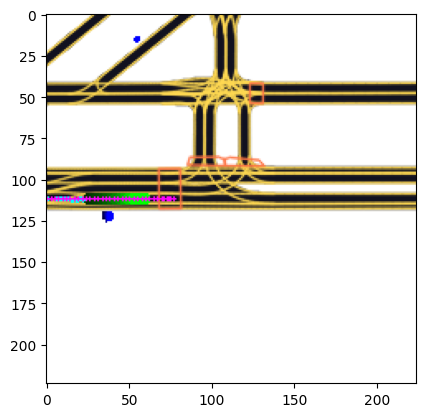

Processing agent 1 in frame 299


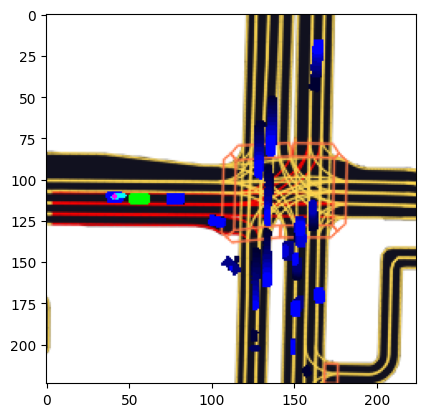

Processing agent 2 in frame 399


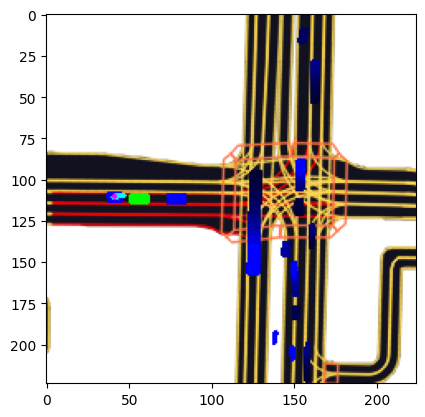

Processing agent 3 in frame 499


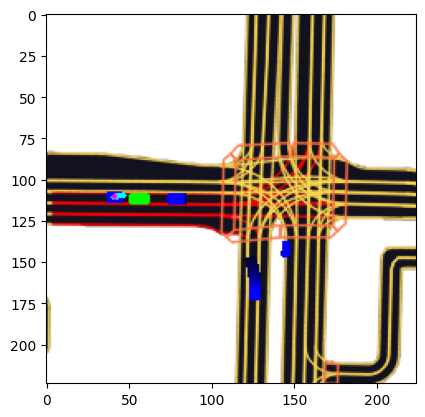

Processing agent 4 in frame 599
Processing agent 5 in frame 599


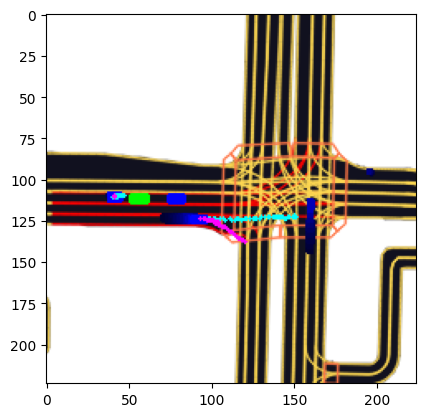

Processing agent 6 in frame 699
Processing agent 7 in frame 699
Processing agent 8 in frame 699
Processing agent 9 in frame 699
Processing agent 10 in frame 699


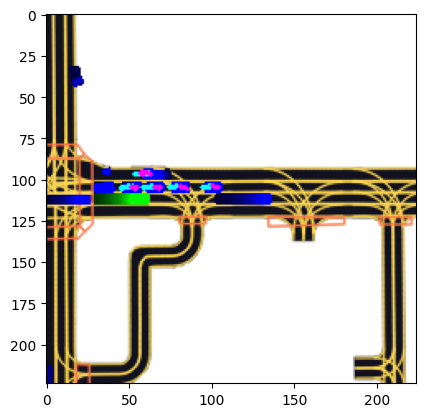

Processing agent 11 in frame 799
Processing agent 12 in frame 799


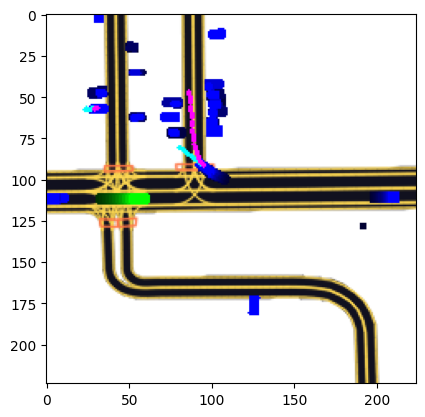

Processing agent 13 in frame 899
Processing agent 14 in frame 899


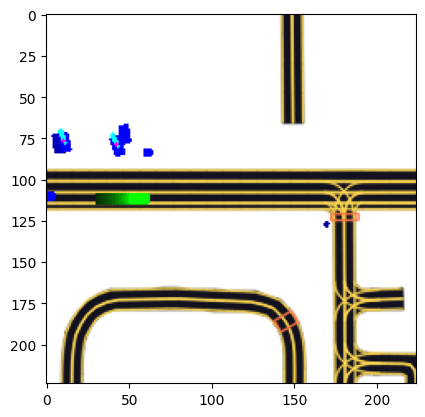

Processing agent 15 in frame 999


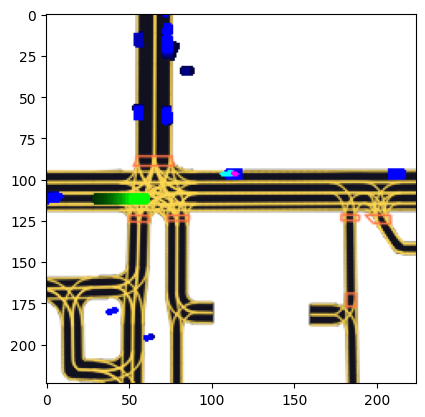

Processing agent 16 in frame 1199
Processing agent 17 in frame 1199


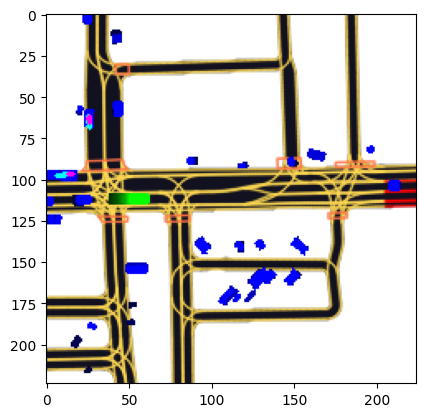

Processing agent 18 in frame 1299
Processing agent 19 in frame 1299
Processing agent 20 in frame 1299
Processing agent 21 in frame 1299
Processing agent 22 in frame 1299
Processing agent 23 in frame 1299


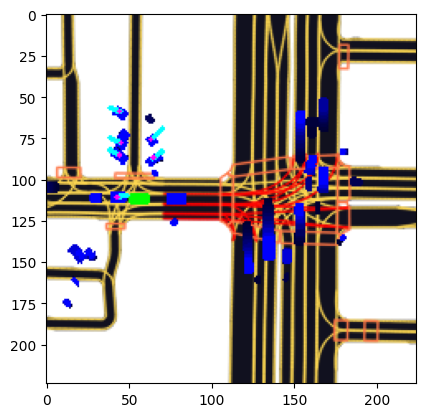

Processing agent 24 in frame 1399
Processing agent 25 in frame 1399
Processing agent 26 in frame 1399
Processing agent 27 in frame 1399
Processing agent 28 in frame 1399
Processing agent 29 in frame 1399
Processing agent 30 in frame 1399
Processing agent 31 in frame 1399
Processing agent 32 in frame 1399
Processing agent 33 in frame 1399
Processing agent 34 in frame 1399
Processing agent 35 in frame 1399


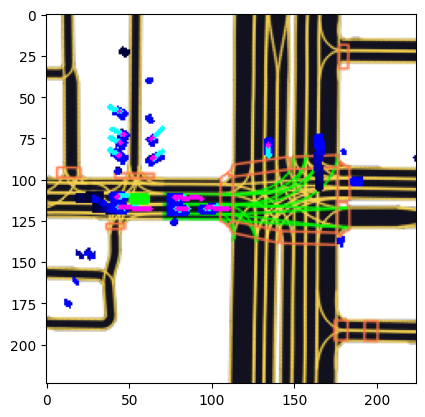

Processing agent 36 in frame 1499
Processing agent 37 in frame 1499
Processing agent 38 in frame 1499
Processing agent 39 in frame 1499
Processing agent 40 in frame 1499
Processing agent 41 in frame 1499
Processing agent 42 in frame 1499
Processing agent 43 in frame 1499
Processing agent 44 in frame 1499
Processing agent 45 in frame 1499


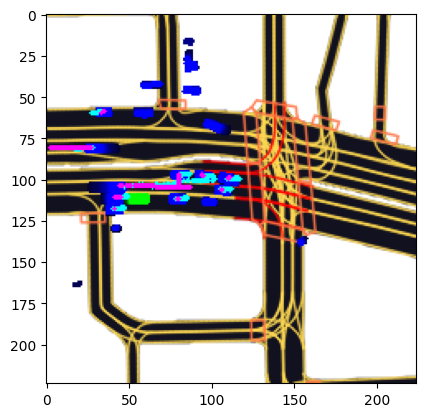

Processing agent 46 in frame 1599
Processing agent 47 in frame 1599
Processing agent 48 in frame 1599
Processing agent 49 in frame 1599
Processing agent 50 in frame 1599
Processing agent 51 in frame 1599
Processing agent 52 in frame 1599
Processing agent 53 in frame 1599
Processing agent 54 in frame 1599
Processing agent 55 in frame 1599
Processing agent 56 in frame 1599
Processing agent 57 in frame 1599
Processing agent 58 in frame 1599
Processing agent 59 in frame 1599


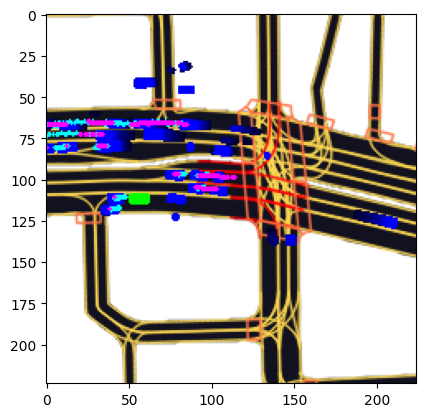

Processing agent 60 in frame 1699
Processing agent 61 in frame 1699
Processing agent 62 in frame 1699
Processing agent 63 in frame 1699
Processing agent 64 in frame 1699
Processing agent 65 in frame 1699
Processing agent 66 in frame 1699
Processing agent 67 in frame 1699
Processing agent 68 in frame 1699


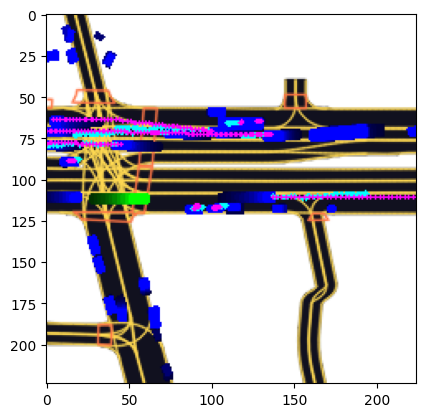

Processing agent 69 in frame 1799
Processing agent 70 in frame 1799
Processing agent 71 in frame 1799
Processing agent 72 in frame 1799
Processing agent 73 in frame 1799
Processing agent 74 in frame 1799
Processing agent 75 in frame 1799
Processing agent 76 in frame 1799
Processing agent 77 in frame 1799
Processing agent 78 in frame 1799
Processing agent 79 in frame 1799
Processing agent 80 in frame 1799


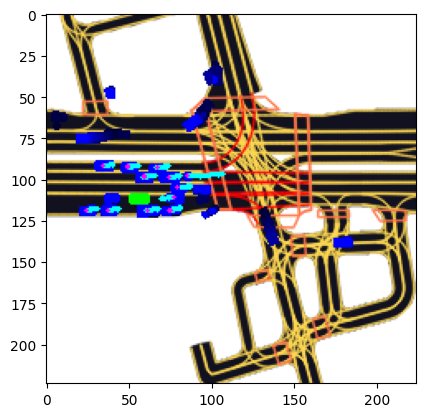

Processing agent 81 in frame 1899
Processing agent 82 in frame 1899
Processing agent 83 in frame 1899
Processing agent 84 in frame 1899
Processing agent 85 in frame 1899
Processing agent 86 in frame 1899
Processing agent 87 in frame 1899
Processing agent 88 in frame 1899
Processing agent 89 in frame 1899
Processing agent 90 in frame 1899
Processing agent 91 in frame 1899


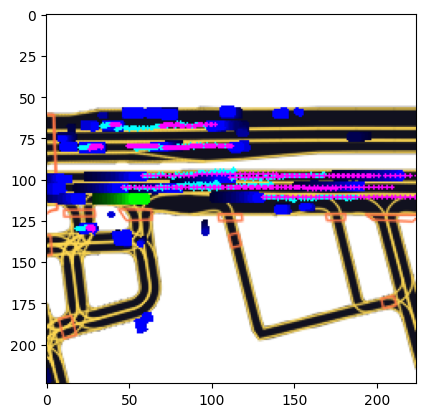

Processing agent 92 in frame 1999
Processing agent 93 in frame 1999
Processing agent 94 in frame 1999


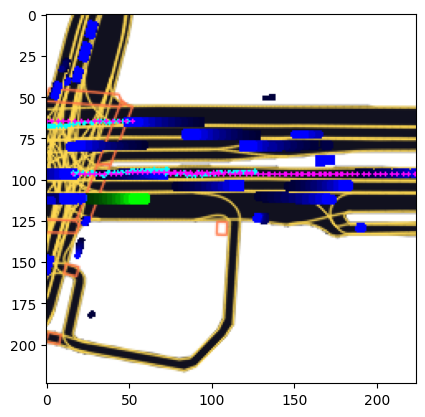

Processing agent 95 in frame 2099
Processing agent 96 in frame 2099
Processing agent 97 in frame 2099
Processing agent 98 in frame 2099
Processing agent 99 in frame 2099


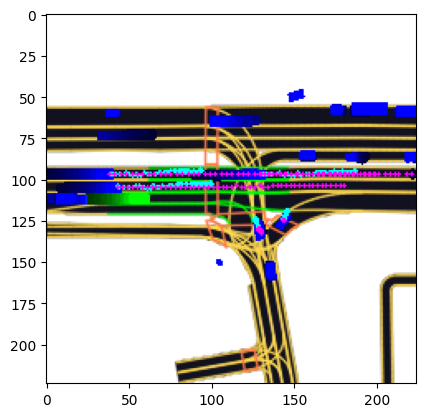

Processing agent 100 in frame 2199
Processing agent 101 in frame 2199
Processing agent 102 in frame 2199
Processing agent 103 in frame 2199
Processing agent 104 in frame 2199
Processing agent 105 in frame 2199


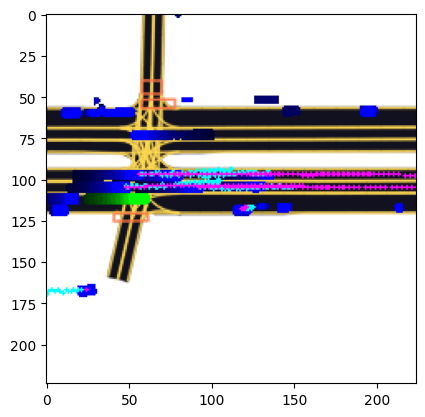

Processing agent 106 in frame 2299
Processing agent 107 in frame 2299


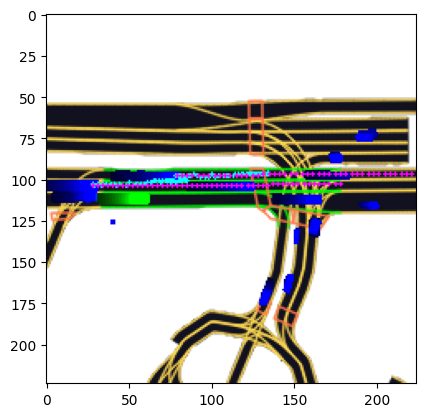

Processing agent 108 in frame 2499
Processing agent 109 in frame 2499
Processing agent 110 in frame 2499


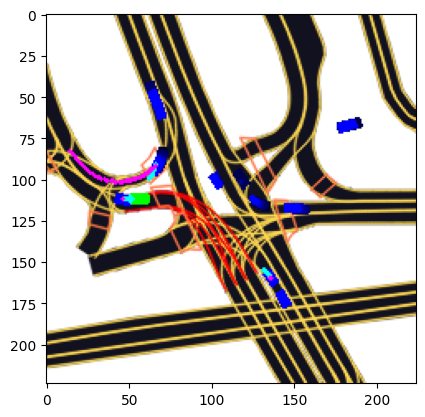

Processing agent 111 in frame 2599
Processing agent 112 in frame 2599
Processing agent 113 in frame 2599
Processing agent 114 in frame 2599


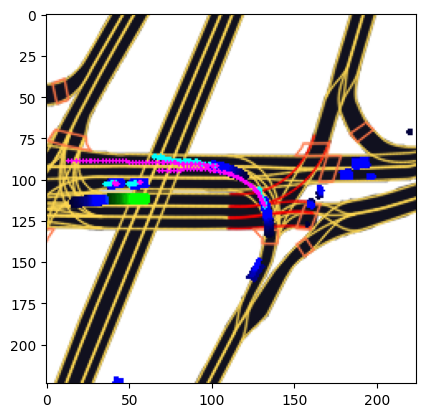

Processing agent 115 in frame 2699
Processing agent 116 in frame 2699
Processing agent 117 in frame 2699
Processing agent 118 in frame 2699
Processing agent 119 in frame 2699
Processing agent 120 in frame 2699


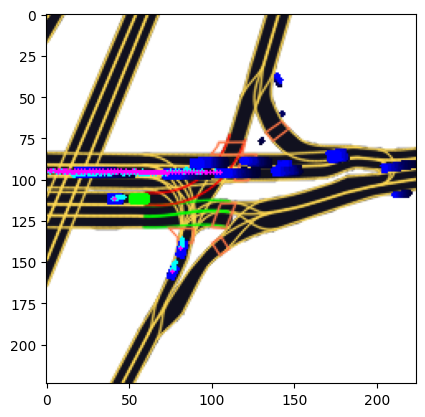

Processing agent 121 in frame 2799
Processing agent 122 in frame 2799
Processing agent 123 in frame 2799
Processing agent 124 in frame 2799
Processing agent 125 in frame 2799


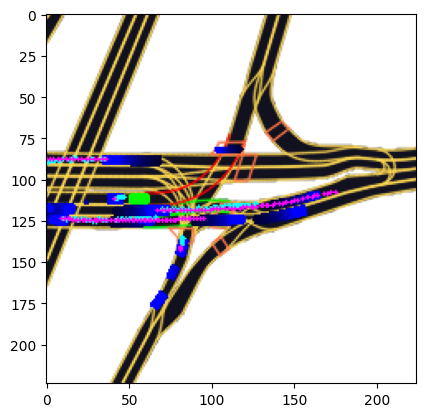

Processing agent 126 in frame 2899


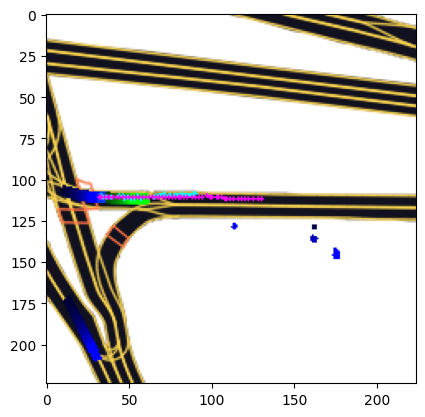

Processing agent 127 in frame 2999
Processing agent 128 in frame 2999


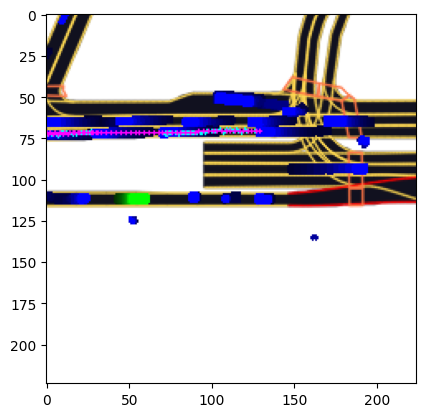

Processing agent 129 in frame 3099
Processing agent 130 in frame 3099


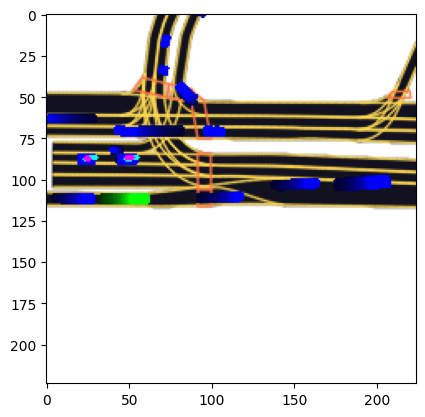

Processing agent 131 in frame 3199
Processing agent 132 in frame 3199
Processing agent 133 in frame 3199
Processing agent 134 in frame 3199
Processing agent 135 in frame 3199
Processing agent 136 in frame 3199
Processing agent 137 in frame 3199
Processing agent 138 in frame 3199
Processing agent 139 in frame 3199
Processing agent 140 in frame 3199
Processing agent 141 in frame 3199
Processing agent 142 in frame 3199


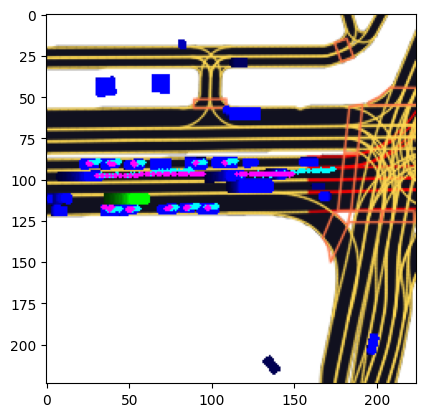

Processing agent 143 in frame 3299
Processing agent 144 in frame 3299
Processing agent 145 in frame 3299
Processing agent 146 in frame 3299
Processing agent 147 in frame 3299
Processing agent 148 in frame 3299
Processing agent 149 in frame 3299
Processing agent 150 in frame 3299
Processing agent 151 in frame 3299
Processing agent 152 in frame 3299


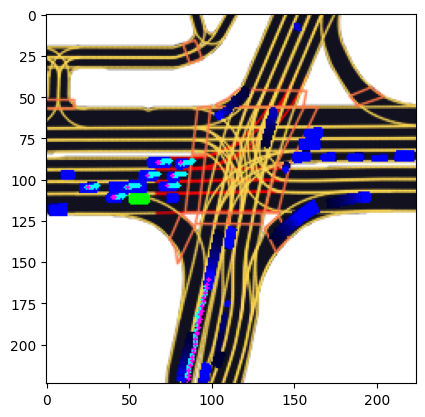

Processing agent 153 in frame 3399
Processing agent 154 in frame 3399
Processing agent 155 in frame 3399
Processing agent 156 in frame 3399
Processing agent 157 in frame 3399
Processing agent 158 in frame 3399
Processing agent 159 in frame 3399
Processing agent 160 in frame 3399
Processing agent 161 in frame 3399
Processing agent 162 in frame 3399
Processing agent 163 in frame 3399


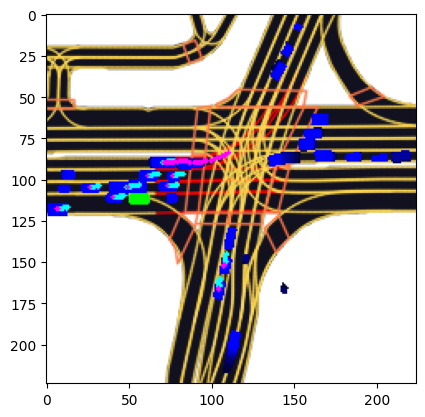

Processing agent 164 in frame 3499
Processing agent 165 in frame 3499
Processing agent 166 in frame 3499
Processing agent 167 in frame 3499
Processing agent 168 in frame 3499
Processing agent 169 in frame 3499
Processing agent 170 in frame 3499
Processing agent 171 in frame 3499
Processing agent 172 in frame 3499


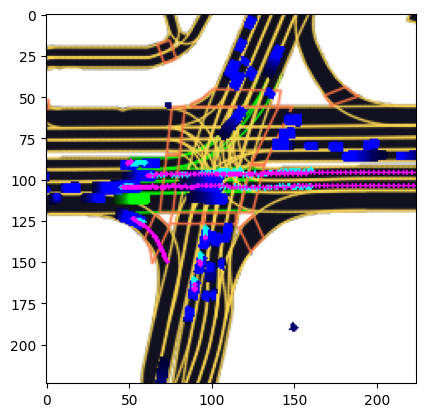

Processing agent 173 in frame 3599
Processing agent 174 in frame 3599


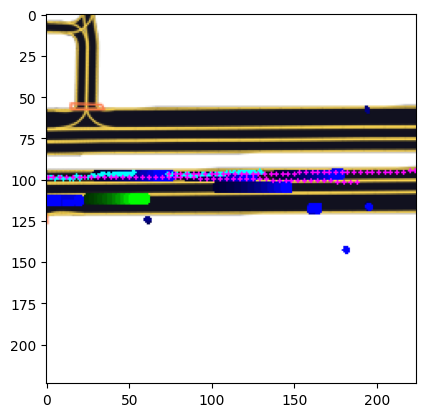

Processing agent 175 in frame 3699
Processing agent 176 in frame 3699
Processing agent 177 in frame 3699
Processing agent 178 in frame 3699


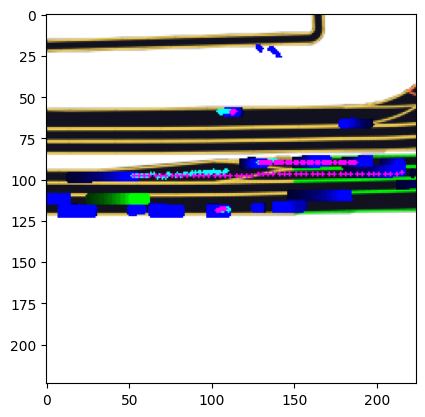

Processing agent 179 in frame 3799
Processing agent 180 in frame 3799
Processing agent 181 in frame 3799


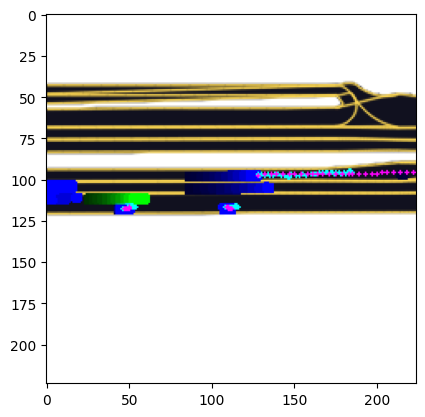

Processing agent 182 in frame 3899
Processing agent 183 in frame 3899
Processing agent 184 in frame 3899
Processing agent 185 in frame 3899
Processing agent 186 in frame 3899
Processing agent 187 in frame 3899
Processing agent 188 in frame 3899
Processing agent 189 in frame 3899
Processing agent 190 in frame 3899


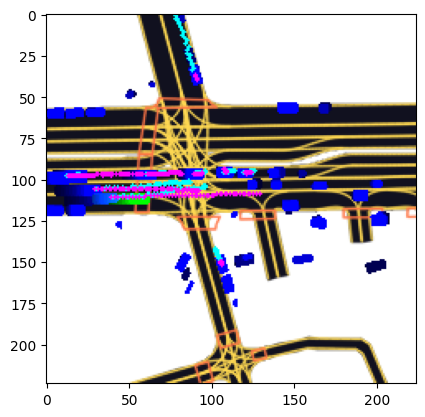

Processing agent 191 in frame 3999
Processing agent 192 in frame 3999
Processing agent 193 in frame 3999
Processing agent 194 in frame 3999
Processing agent 195 in frame 3999
Processing agent 196 in frame 3999
Processing agent 197 in frame 3999
Processing agent 198 in frame 3999


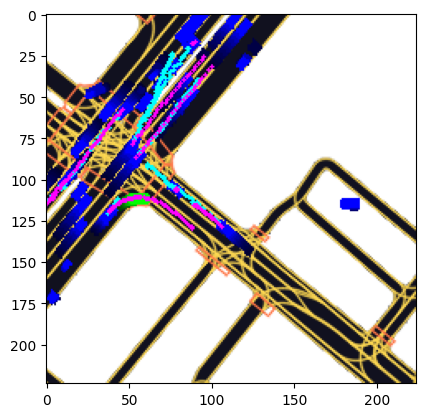

Processing agent 199 in frame 4099
Processing agent 200 in frame 4099
Processing agent 201 in frame 4099


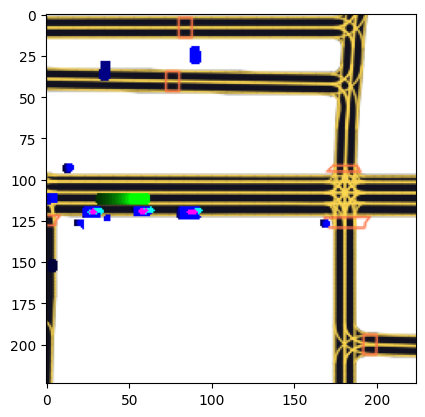

Processing agent 202 in frame 4199
Processing agent 203 in frame 4199


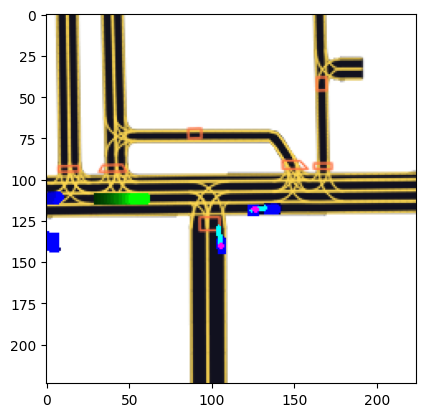

Processing agent 204 in frame 4399
Processing agent 205 in frame 4399
Processing agent 206 in frame 4399
Processing agent 207 in frame 4399
Processing agent 208 in frame 4399


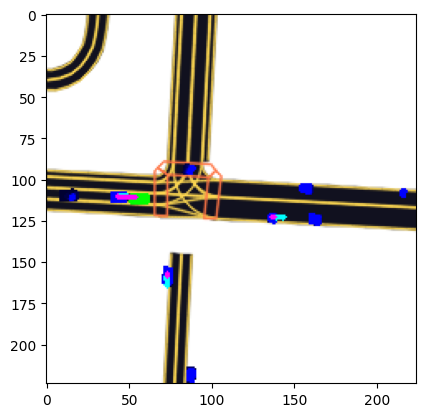

Processing agent 209 in frame 5299
Processing agent 210 in frame 5299


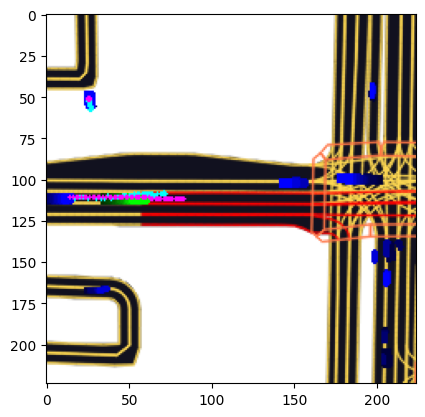

Processing agent 211 in frame 5399
Processing agent 212 in frame 5399
Processing agent 213 in frame 5399
Processing agent 214 in frame 5399
Processing agent 215 in frame 5399
Processing agent 216 in frame 5399
Processing agent 217 in frame 5399
Processing agent 218 in frame 5399
Processing agent 219 in frame 5399
Processing agent 220 in frame 5399
Processing agent 221 in frame 5399


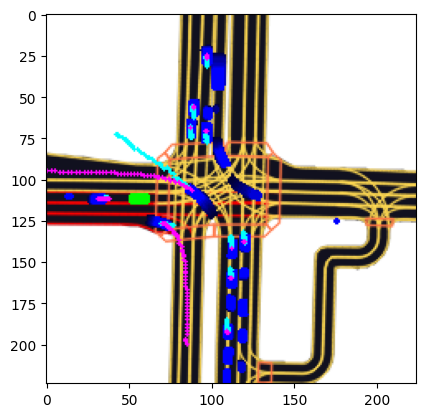

Processing agent 222 in frame 5499
Processing agent 223 in frame 5499
Processing agent 224 in frame 5499
Processing agent 225 in frame 5499
Processing agent 226 in frame 5499


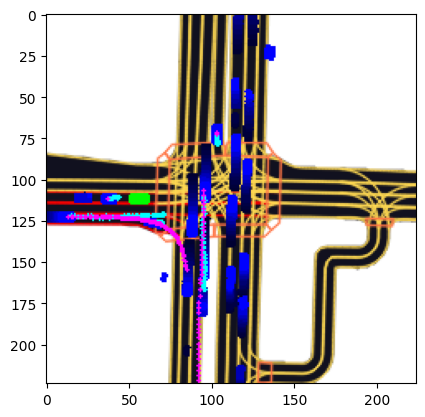

Processing agent 227 in frame 5599
Processing agent 228 in frame 5599
Processing agent 229 in frame 5599
Processing agent 230 in frame 5599


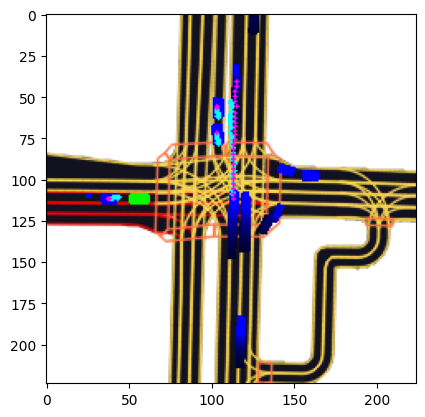

Processing agent 231 in frame 5699
Processing agent 232 in frame 5699


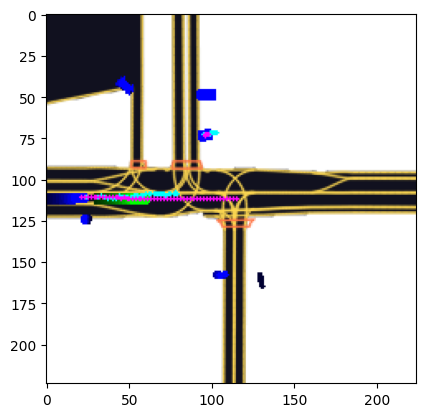

Processing agent 233 in frame 5799
Processing agent 234 in frame 5799
Processing agent 235 in frame 5799
Processing agent 236 in frame 5799
Processing agent 237 in frame 5799
Processing agent 238 in frame 5799
Processing agent 239 in frame 5799
Processing agent 240 in frame 5799


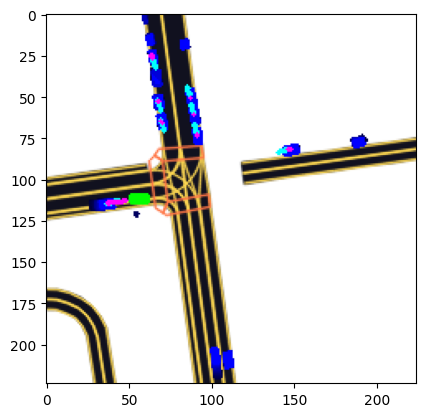

Processing agent 241 in frame 5899
Processing agent 242 in frame 5899
Processing agent 243 in frame 5899
Processing agent 244 in frame 5899
Processing agent 245 in frame 5899


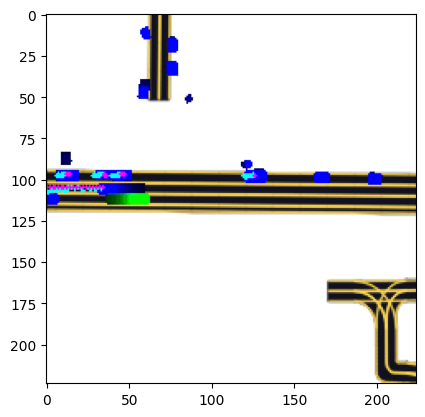

Processing agent 246 in frame 5999
Processing agent 247 in frame 5999
Processing agent 248 in frame 5999
Processing agent 249 in frame 5999
Processing agent 250 in frame 5999
Processing agent 251 in frame 5999


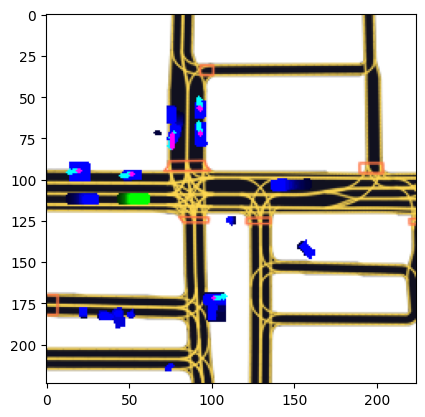

Processing agent 252 in frame 6099
Processing agent 253 in frame 6099
Processing agent 254 in frame 6099
Processing agent 255 in frame 6099
Processing agent 256 in frame 6099
Processing agent 257 in frame 6099
Processing agent 258 in frame 6099
Processing agent 259 in frame 6099
Processing agent 260 in frame 6099


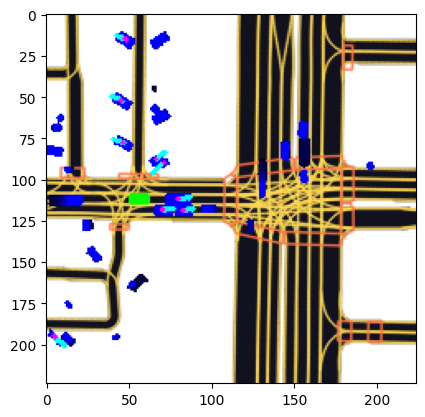

Processing agent 261 in frame 6199
Processing agent 262 in frame 6199
Processing agent 263 in frame 6199
Processing agent 264 in frame 6199
Processing agent 265 in frame 6199
Processing agent 266 in frame 6199
Processing agent 267 in frame 6199
Processing agent 268 in frame 6199


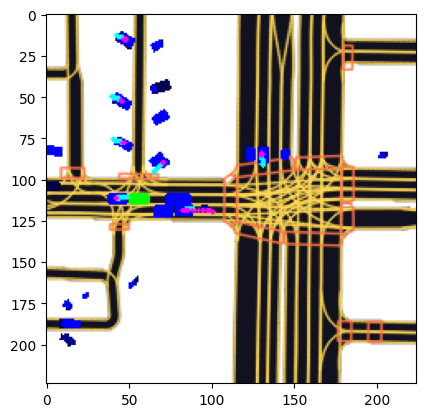

Processing agent 269 in frame 6299
Processing agent 270 in frame 6299
Processing agent 271 in frame 6299
Processing agent 272 in frame 6299
Processing agent 273 in frame 6299
Processing agent 274 in frame 6299
Processing agent 275 in frame 6299
Processing agent 276 in frame 6299
Processing agent 277 in frame 6299


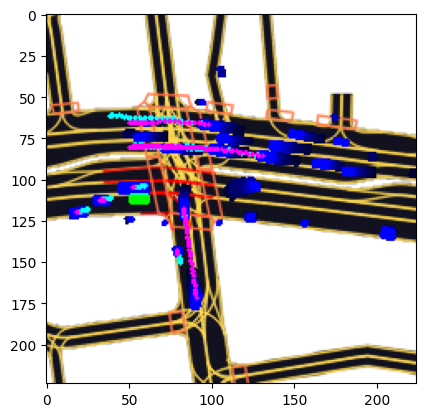

Processing agent 278 in frame 6399
Processing agent 279 in frame 6399
Processing agent 280 in frame 6399
Processing agent 281 in frame 6399
Processing agent 282 in frame 6399
Processing agent 283 in frame 6399
Processing agent 284 in frame 6399
Processing agent 285 in frame 6399
Processing agent 286 in frame 6399
Processing agent 287 in frame 6399
Processing agent 288 in frame 6399
Processing agent 289 in frame 6399


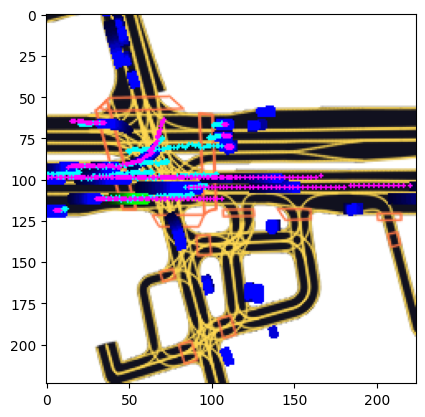

Processing agent 290 in frame 6499
Processing agent 291 in frame 6499
Processing agent 292 in frame 6499
Processing agent 293 in frame 6499
Processing agent 294 in frame 6499
Processing agent 295 in frame 6499


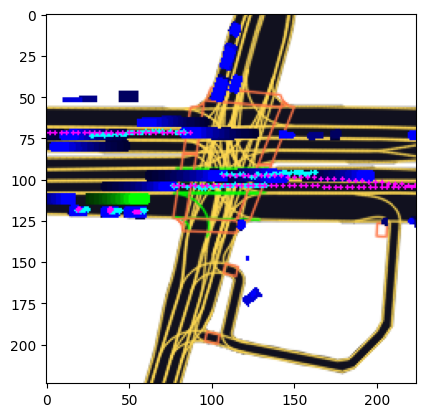

Processing agent 296 in frame 6599
Processing agent 297 in frame 6599
Processing agent 298 in frame 6599


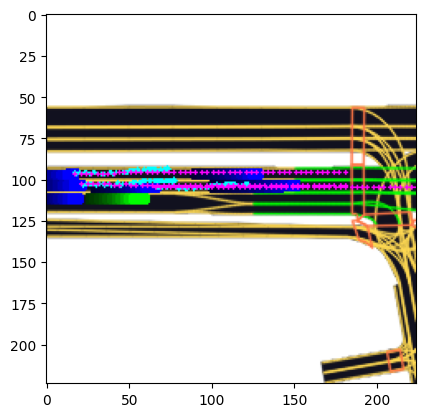

Processing agent 299 in frame 6699
Processing agent 300 in frame 6699
Processing agent 301 in frame 6699
Processing agent 302 in frame 6699
Processing agent 303 in frame 6699


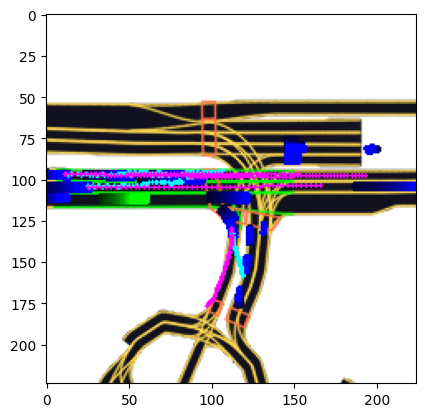

Processing agent 304 in frame 6799
Processing agent 305 in frame 6799
Processing agent 306 in frame 6799
Processing agent 307 in frame 6799
Processing agent 308 in frame 6799
Processing agent 309 in frame 6799
Processing agent 310 in frame 6799
Processing agent 311 in frame 6799
Processing agent 312 in frame 6799
Processing agent 313 in frame 6799
Processing agent 314 in frame 6799
Processing agent 315 in frame 6799
Processing agent 316 in frame 6799


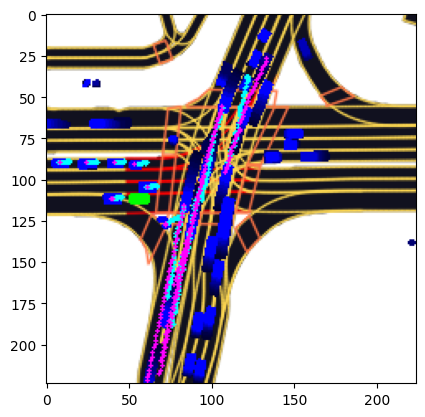

Processing agent 317 in frame 6899
Processing agent 318 in frame 6899
Processing agent 319 in frame 6899
Processing agent 320 in frame 6899
Processing agent 321 in frame 6899
Processing agent 322 in frame 6899
Processing agent 323 in frame 6899
Processing agent 324 in frame 6899
Processing agent 325 in frame 6899


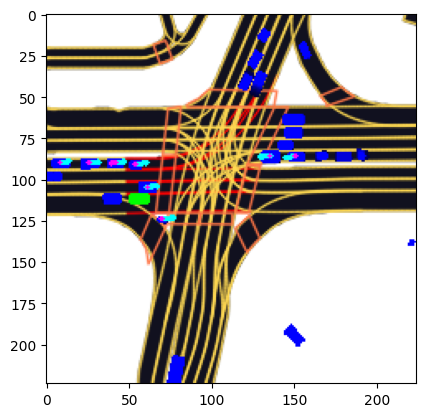

Processing agent 326 in frame 6999
Processing agent 327 in frame 6999
Processing agent 328 in frame 6999
Processing agent 329 in frame 6999
Processing agent 330 in frame 6999
Processing agent 331 in frame 6999
Processing agent 332 in frame 6999
Processing agent 333 in frame 6999
Processing agent 334 in frame 6999
Processing agent 335 in frame 6999
Processing agent 336 in frame 6999


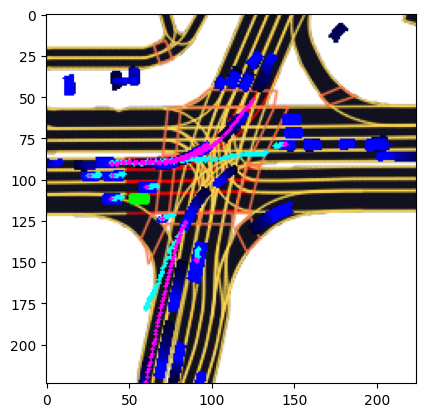

Processing agent 337 in frame 7099
Processing agent 338 in frame 7099
Processing agent 339 in frame 7099


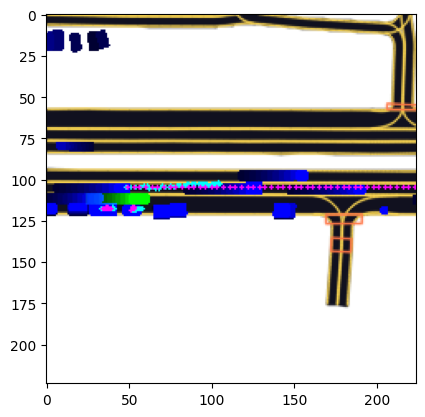

Processing agent 340 in frame 7199
Processing agent 341 in frame 7199


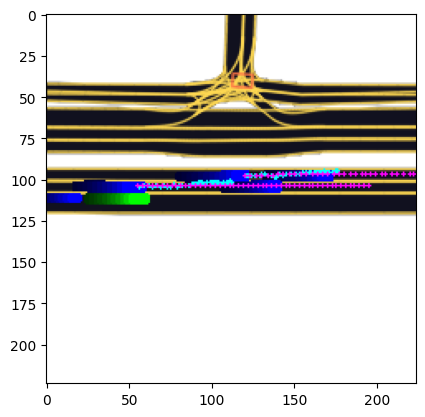

Processing agent 342 in frame 7299
Processing agent 343 in frame 7299
Processing agent 344 in frame 7299
Processing agent 345 in frame 7299
Processing agent 346 in frame 7299
Processing agent 347 in frame 7299
Processing agent 348 in frame 7299
Processing agent 349 in frame 7299


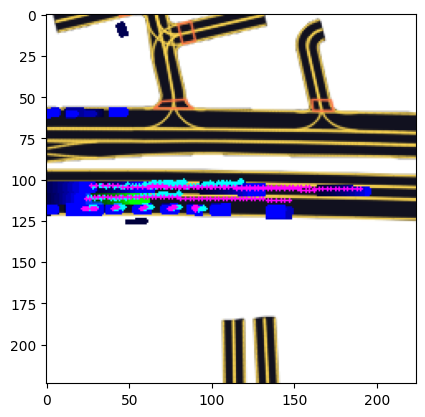

Processing agent 350 in frame 7399
Processing agent 351 in frame 7399
Processing agent 352 in frame 7399
Processing agent 353 in frame 7399
Processing agent 354 in frame 7399
Processing agent 355 in frame 7399
Processing agent 356 in frame 7399


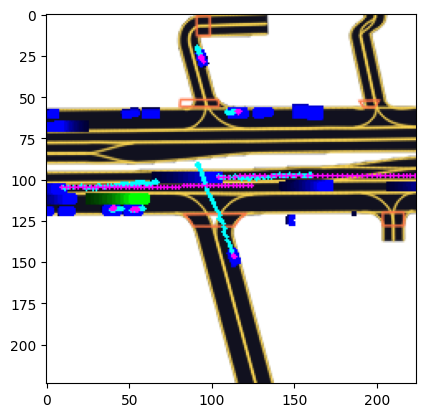

Processing agent 357 in frame 7499
Processing agent 358 in frame 7499
Processing agent 359 in frame 7499
Processing agent 360 in frame 7499
Processing agent 361 in frame 7499
Processing agent 362 in frame 7499
Processing agent 363 in frame 7499
Processing agent 364 in frame 7499
Processing agent 365 in frame 7499


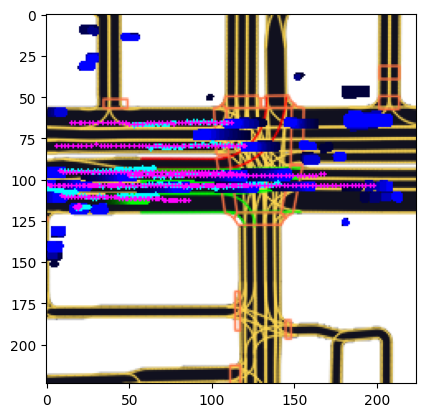

Processing agent 366 in frame 7599
Processing agent 367 in frame 7599


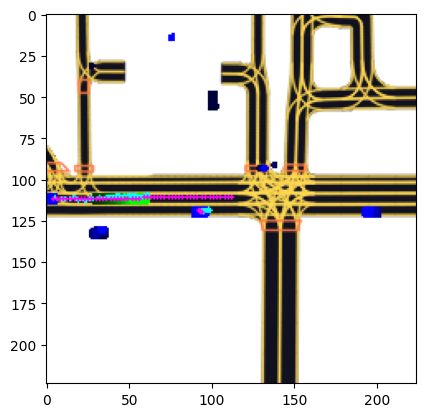

Processing agent 368 in frame 7699
Processing agent 369 in frame 7699
Processing agent 370 in frame 7699
Processing agent 371 in frame 7699


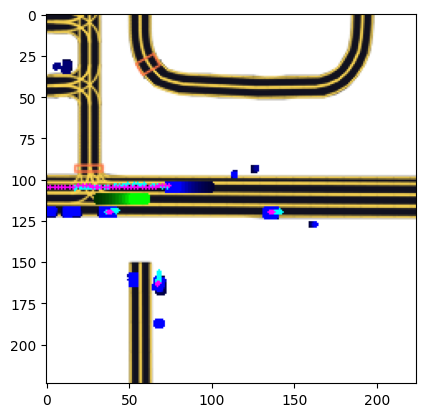

Processing agent 372 in frame 7799


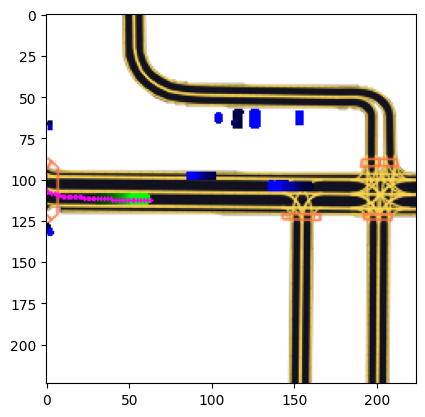

Processing agent 373 in frame 7999
Processing agent 374 in frame 7999
Processing agent 375 in frame 7999
Processing agent 376 in frame 7999
Processing agent 377 in frame 7999
Processing agent 378 in frame 7999
Processing agent 379 in frame 7999
Processing agent 380 in frame 7999


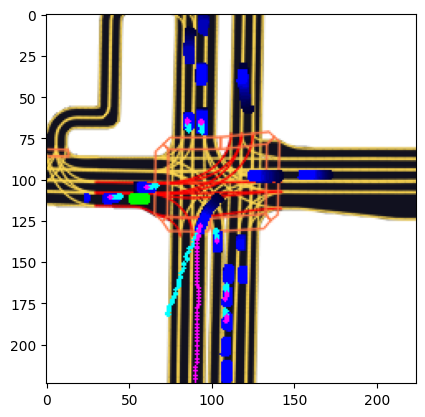

Processing agent 381 in frame 8099
Processing agent 382 in frame 8099


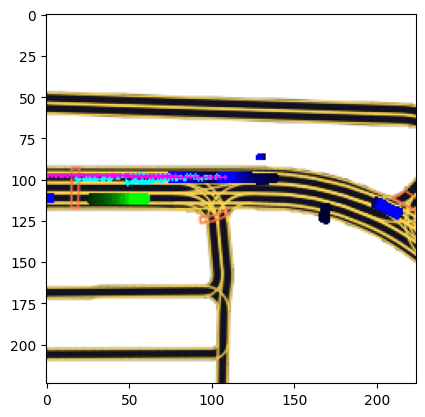

Processing agent 383 in frame 8199


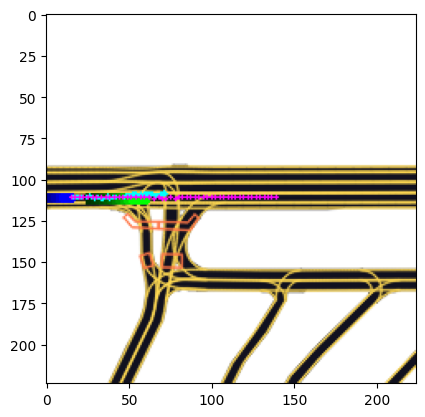

Processing agent 384 in frame 8299
Processing agent 385 in frame 8299


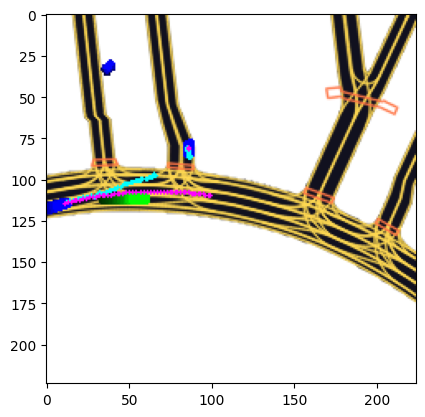

Processing agent 386 in frame 8499


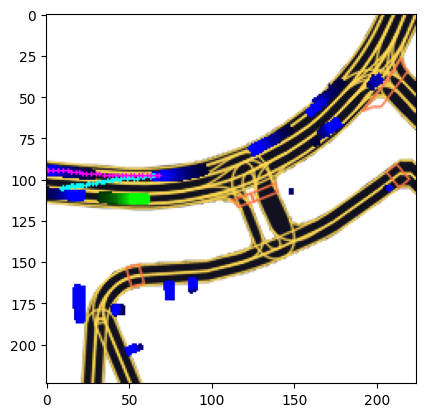

Processing agent 387 in frame 8599
Processing agent 388 in frame 8599
Processing agent 389 in frame 8599


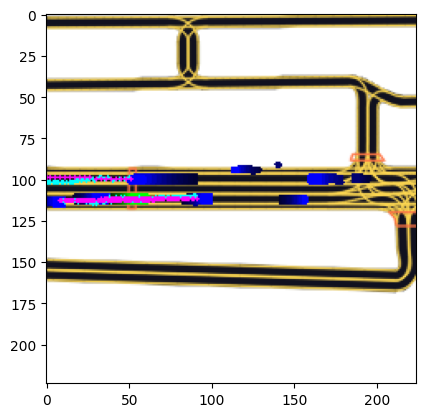

Processing agent 390 in frame 8699
Processing agent 391 in frame 8699
Processing agent 392 in frame 8699
Processing agent 393 in frame 8699
Processing agent 394 in frame 8699
Processing agent 395 in frame 8699
Processing agent 396 in frame 8699
Processing agent 397 in frame 8699
Processing agent 398 in frame 8699


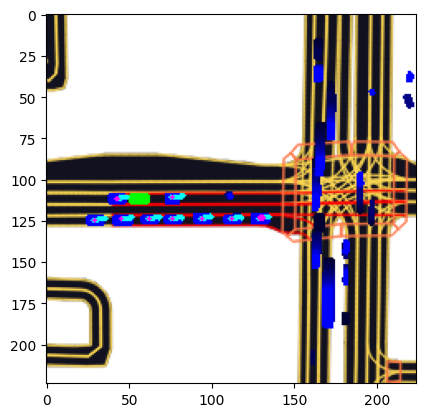

Processing agent 399 in frame 8799
Processing agent 400 in frame 8799
Processing agent 401 in frame 8799
Processing agent 402 in frame 8799
Processing agent 403 in frame 8799
Processing agent 404 in frame 8799
Processing agent 405 in frame 8799
Processing agent 406 in frame 8799
Processing agent 407 in frame 8799
Processing agent 408 in frame 8799
Processing agent 409 in frame 8799
Processing agent 410 in frame 8799


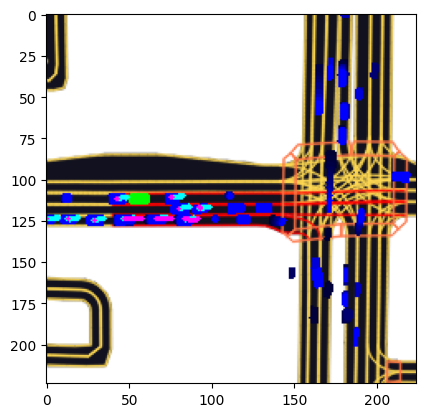

Processing agent 411 in frame 8899
Processing agent 412 in frame 8899
Processing agent 413 in frame 8899
Processing agent 414 in frame 8899
Processing agent 415 in frame 8899
Processing agent 416 in frame 8899
Processing agent 417 in frame 8899
Processing agent 418 in frame 8899
Processing agent 419 in frame 8899
Processing agent 420 in frame 8899
Processing agent 421 in frame 8899
Processing agent 422 in frame 8899
Processing agent 423 in frame 8899
Processing agent 424 in frame 8899


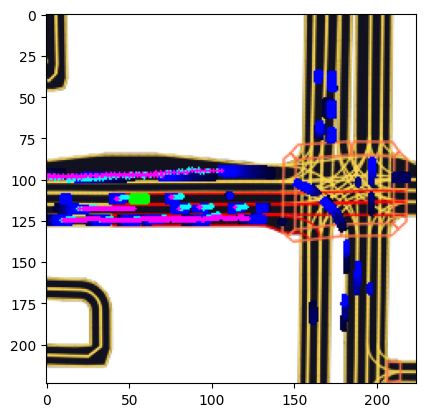

Processing agent 425 in frame 8999
Processing agent 426 in frame 8999
Processing agent 427 in frame 8999
Processing agent 428 in frame 8999
Processing agent 429 in frame 8999
Processing agent 430 in frame 8999
Processing agent 431 in frame 8999


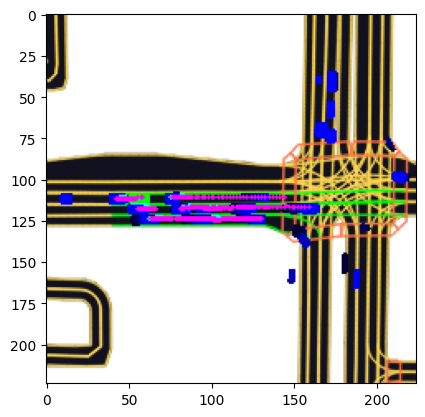

Processing agent 432 in frame 9099


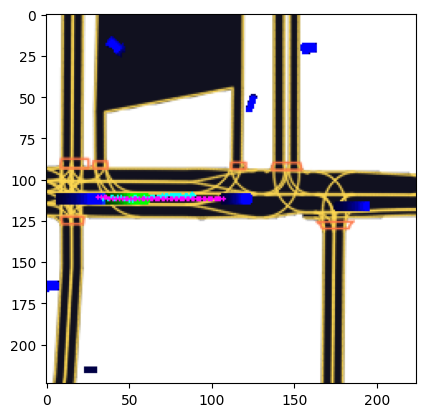

Processing agent 433 in frame 9199
Processing agent 434 in frame 9199
Processing agent 435 in frame 9199


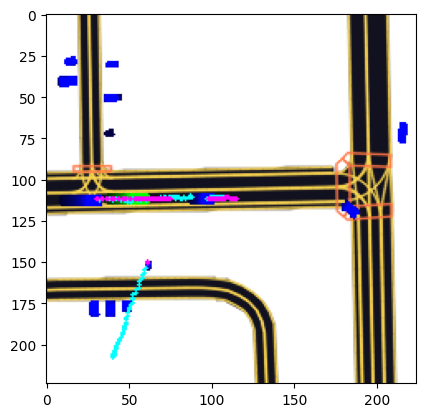

Processing agent 436 in frame 9299
Processing agent 437 in frame 9299
Processing agent 438 in frame 9299
Processing agent 439 in frame 9299
Processing agent 440 in frame 9299
Processing agent 441 in frame 9299
Processing agent 442 in frame 9299


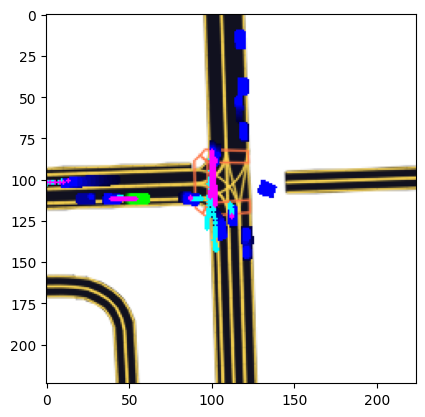

Processing agent 443 in frame 9399
Processing agent 444 in frame 9399
Processing agent 445 in frame 9399
Processing agent 446 in frame 9399
Processing agent 447 in frame 9399
Processing agent 448 in frame 9399
Processing agent 449 in frame 9399
Processing agent 450 in frame 9399
Processing agent 451 in frame 9399


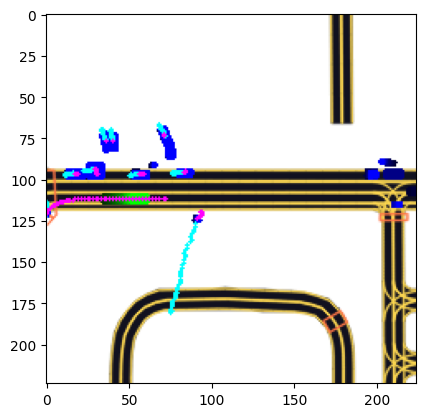

Processing agent 452 in frame 9499
Processing agent 453 in frame 9499


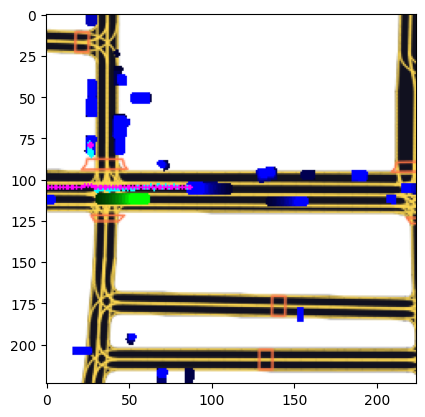

Processing agent 454 in frame 9699
Processing agent 455 in frame 9699
Processing agent 456 in frame 9699
Processing agent 457 in frame 9699
Processing agent 458 in frame 9699
Processing agent 459 in frame 9699
Processing agent 460 in frame 9699


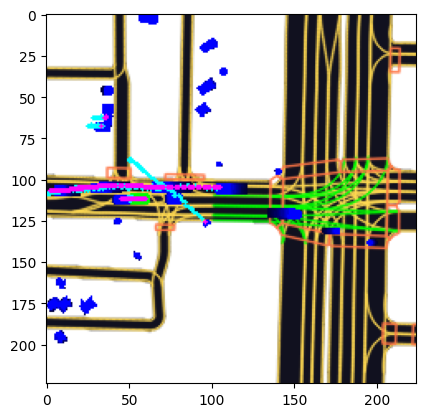

Processing agent 461 in frame 9799
Processing agent 462 in frame 9799
Processing agent 463 in frame 9799
Processing agent 464 in frame 9799
Processing agent 465 in frame 9799
Processing agent 466 in frame 9799
Processing agent 467 in frame 9799


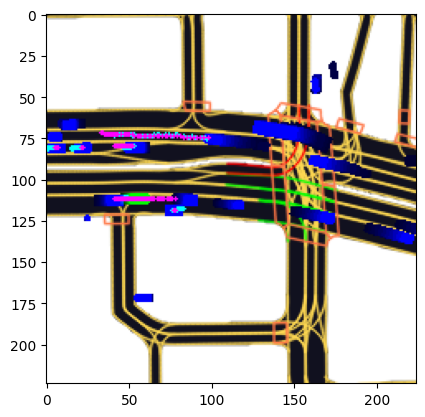

Processing agent 468 in frame 9899
Processing agent 469 in frame 9899
Processing agent 470 in frame 9899
Processing agent 471 in frame 9899
Processing agent 472 in frame 9899


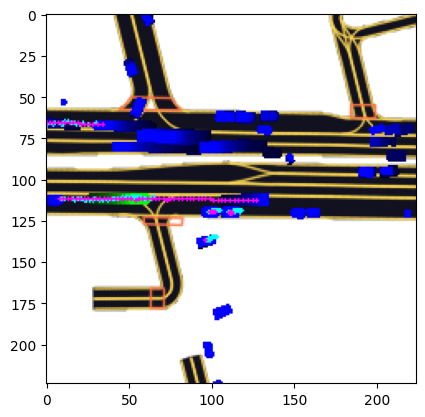

Processing agent 473 in frame 9999
Processing agent 474 in frame 9999
Processing agent 475 in frame 9999
Processing agent 476 in frame 9999
Processing agent 477 in frame 9999
Processing agent 478 in frame 9999
Processing agent 479 in frame 9999


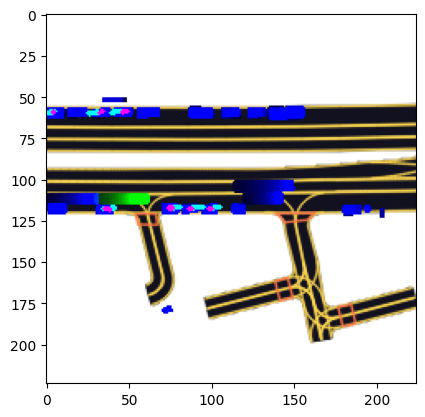

In [15]:
model.eval()
torch.set_grad_enabled(False)

# build a dict to retrieve future trajectories from GT
gt_rows = {}
for row in read_gt_csv(eval_gt_path):
    gt_rows[row["track_id"] + row["timestamp"]] = row["coord"]

eval_ego_dataset = EgoDataset(cfg, eval_dataset.dataset, rasterizer)

for frame_number in range(99, len(eval_zarr.frames), 100):  # start from last frame of scene_0 and increase by 100
    agent_indices = eval_dataset.get_frame_indices(frame_number) 
    if not len(agent_indices):
        continue

    # get AV point-of-view frame
    data_ego = eval_ego_dataset[frame_number]
    im_ego = rasterizer.to_rgb(data_ego["image"].transpose(1, 2, 0))
    center = np.asarray(cfg["raster_params"]["ego_center"]) * cfg["raster_params"]["raster_size"]
    
    predicted_positions = []
    target_positions = []

    for v_index in agent_indices:
        print(f"Processing agent {v_index} in frame {frame_number}")
        data_agent = eval_dataset[v_index]

        out_net = model(torch.from_numpy(data_agent["image"]).unsqueeze(0).to(device))
        out_pos = out_net[0].reshape(-1, 2).detach().cpu().numpy()
        # store absolute world coordinates
        predicted_positions.append(transform_points(out_pos, data_agent["world_from_agent"]))
        # retrieve target positions from the GT and store as absolute coordinates
        track_id, timestamp = data_agent["track_id"], data_agent["timestamp"]
        target_positions.append(gt_rows[str(track_id) + str(timestamp)] + data_agent["centroid"][:2])


    # convert coordinates to AV point-of-view so we can draw them
    predicted_positions = transform_points(np.concatenate(predicted_positions), data_ego["raster_from_world"])
    target_positions = transform_points(np.concatenate(target_positions), data_ego["raster_from_world"])

    draw_trajectory(im_ego, predicted_positions, PREDICTED_POINTS_COLOR)
    draw_trajectory(im_ego, target_positions, TARGET_POINTS_COLOR)

    plt.imshow(im_ego)
    plt.show()

In [16]:
# # Visualization (single example)
# batch = next(iter(eval_dataloader))
# with torch.no_grad():
#     preds = model(batch["image"])

# # Pick first mode of predictions
# preds = preds[:, 0, :].view(-1, cfg["model_params"]["future_num_frames"], 2).cpu().numpy()
# gt = batch["target_positions"].cpu().numpy()

# fig, ax = plt.subplots(figsize=(8, 8))
# ax.imshow(batch["image"][0].permute(1, 2, 0).cpu().numpy())
# draw_trajectory(gt[0], ax, color="g", origin=(0, 0))  # Ground truth
# draw_trajectory(preds[0], ax, color="r", origin=(0, 0))  # Prediction
# ax.set_title("Green = GT, Red = Prediction")
# plt.show()

In [17]:
# batch = next(iter(val_loader))
# preds = model(batch["image"])
# preds = preds[:, 0, :].view(-1, cfg["model_params"]["future_num_frames"], 2).detach().numpy()

# fig, ax = plt.subplots(figsize=(8, 8))
# img = batch["image"][0].permute(1, 2, 0).numpy()
# ax.imshow(img)

# # Draw predicted trajectory (red) & ground truth (green)
# draw_trajectory(preds[0], ax, color="r", origin=(0, 0))
# draw_trajectory(batch["target_positions"][0].numpy(), ax, color="g", origin=(0, 0))
# plt.show()